<h1>Making Music From Images</h1>
<p>This project will showcase how an image can be turned into sound in Python. The program will take a picture as input and produce a numpy array composed of frequencies that can be played.</p>

<p>The basic idea is as follows:</p>
<ul>
    <li>Images are made of pixels.</li>
    <li>Pixels are composed of arrays of numbers that designate color</li> 
    <li>Color is described via color spaces like RGB or HSV for example</li>
    <li>The color could be potentially mapped into a wavelength</li>
    <li>Wavelength can be readily converted into a frequency</li>
    <li>Sound is vibration that can be chracterized by frequencies</li>
    <li>Therefore, an image could be translated into sound</li>
</ul>

<p>With that in mind, let's get started!</p>

<h2>Modules Used in this work</h2>

<p>Here are the most important modules used for this project:</p>

<ul>
    <li> open cv : Used to carry out operations on images </li>
    <li> numpy   : Used to perform computations on array data</li>
    <li> pandas  : Used to load, process, analyze, operate and export dataframes</li>
    <li> matplotlib.pyplot :Used for plotting/visualizing our results</li>
    <li> librosa : Used for musical/audio operations 
</ul>

<p>The API documentation for each of these modules can be found here:</p>
<ul>
    <li><a href="https://pandas.pydata.org/docs/reference/index.html">https://pandas.pydata.org
    <li><a href= "https://matplotlib.org/stable/api/index.html">https://matplotlib.org/stable/api/index.html</a></li>
    <li><a href= "https://numpy.org/doc/stable/reference/index.html#reference">https://numpy.org/doc/stable/reference/index.html#reference</a></li>
    <li><a href= "https://docs.opencv.org/3.4/index.html">https://docs.opencv.org/3.4/index.html</a></li>
    <li><a href = "https://librosa.org/doc/latest/index.html">https://librosa.org/doc/latest/index.html</a></li>
</ul>

In [10]:
#Importing modules
import cv2
import matplotlib.pyplot as plt
from matplotlib import cm
import numpy as np
import pandas as pd
import IPython.display as ipd
import librosa
from midiutil import MIDIFile
import random
from pedalboard import Pedalboard, Chorus, Reverb
from pedalboard.io import AudioFile

ImportError: dlopen(/opt/anaconda3/envs/spaceapps/lib/python3.10/site-packages/scipy/special/_ufuncs.cpython-310-darwin.so, 0x0002): symbol not found in flat namespace '_npy_asinh'

<h2>Loading Image</h2>
<p>I'll start by loading the image using the <code>imread</code> function in OpenCV. The <code>imread</code> function loads images in BGR format by default so I'll change this to RGB to ensure that the colors are parsed/displayed correctly. The image on the left is how <code>imread</code> loads the image (BGR format) and the image on the right is after converting the color space to RGB (this is how the picture looked from the source file.</p>

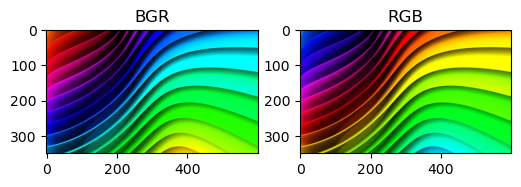

           Image Properties
Height =  350 Width =  600
Number of pixels in image =  210000


In [5]:
#Load the image
ori_img = cv2.imread('colors.jpg')
img = cv2.cvtColor(ori_img, cv2.COLOR_BGR2RGB)

#Get shape of image
height, width, depth = img.shape
dpi = plt.rcParams['figure.dpi']
figsize = width / float(dpi), height / float(dpi)

#Plot the image
fig, axs = plt.subplots(1, 2, figsize = figsize)
axs[0].title.set_text('BGR') 
axs[0].imshow(ori_img)
axs[1].title.set_text('RGB') 
axs[1].imshow(img)
plt.show()
print('           Image Properties')
print('Height = ',height, 'Width = ', width)
print('Number of pixels in image = ', height * width)

<h2>Using HSV Color Space</h2>

<p>HSV is color space that is controlled by 3 values. The 3 values are Hue, Saturation, and Brightness.</p>
<p style="text-align:center;"><img src="https://i.stack.imgur.com/b7V12.png" width = 300 height = 500></p>

<p>Hue is defined as "the degree to which a stimulus can be described as similar to or different from stimuli that are described as red, orange, yellow, green, blue, violet". In other words, Hue represents color.</p>

<p>Saturation is defined as "colorfulness of an area judged in proportion to its brightness". In other words, Saturation represents the amount to which a color is mixed with white.</p>

<p>Brightness is defined as "perception elicited by the luminance of a visual target". In other words, Saturation represents the amount to which a color is mixed with black.</p>

<p>Hue values of basic colors:</p>
<ul>
        <li>Orange  0-44</li>
        <li>Yellow  44- 76</li>
        <li>Green   76-150</li>
        <li>Blue    150-260</li>
        <li>Violet  260-320</li>
        <li>Red     320-360</li>
</ul>

I'll work in HSV color space because I figured it be a little easier to work

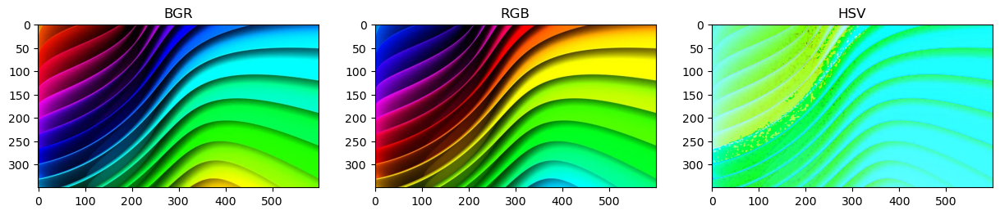

In [11]:
#Need function that reads pixel hue value 
hsv = cv2.cvtColor(ori_img, cv2.COLOR_BGR2HSV)
#Plot the image
fig, axs = plt.subplots(1, 3, figsize = (15,15))
names = ['BGR','RGB','HSV']
imgs  = [ori_img, img, hsv]
i = 0
for elem in imgs:
    axs[i].title.set_text(names[i])
    axs[i].imshow(elem)
    axs[i].grid(False)
    i += 1
plt.show()

<h2>Extract Hue from Image</h2>

<p>Now that we have our image in HSV, let's extract the hue (H) value from every pixel. This can be done via a nested for loop over the height and width of the image.</p>

In [12]:
i=0 ; j=0
#Initialize array the will contain Hues for every pixel in image
hues = [] 
for i in range(height):
    for j in range(width):
        hue = hsv[i][j][0] #This is the hue value at pixel coordinate (i,j)
        hues.append(hue)

<p>Now that we have an array containing the H value for every pixel, I'll place that result into a pandas dataframe. Each row in the dataframe is a pixel and thus each column will contain information about that pixel. I'll call this dataframe <code>pixels_df</code></p> 

In [13]:
pixels_df = pd.DataFrame(hues, columns=['hues'])
pixels_df

,hues
0,100
1,100
2,101
3,101
4,101
...,...
209995,74
209996,74
209997,74
209998,74


<h2>Converting hues to frequencies (1st Idea)</h2>
<p>My initial idea at converting a hue value into a frequency involved a simple mapping between a predetermined set of frequencies to the H value. The mapping function is shown below. The function takes the H value and an array containing frequencies to map H to as inputs. Below, the example uses an array called <code>scale_freqs</code> to define the frequencies. The frequencies used in <code>scale_freqs</code> correspond to the A Harmonic Minor Scale. Then, an array of threshold values (called <code>thresholds</code>) for H is defined. This array of thresholds can then be used to convert H into a frequency from  <code>scale_freqs</code>. 

In [19]:
#Define frequencies that make up A-Harmonic Minor Scale
scale_freqs = [220.00, 246.94 ,261.63, 293.66, 329.63, 349.23, 415.30] 
def hue2freq(h,scale_freqs):
    thresholds = [26 , 52 , 78 , 104,  128 , 154 , 180]
    note = scale_freqs[0]
    if (h <= thresholds[0]):
         note = scale_freqs[0]
    elif (h > thresholds[0]) & (h <= thresholds[1]):
        note = scale_freqs[1]
    elif (h > thresholds[1]) & (h <= thresholds[2]):
        note = scale_freqs[2]
    elif (h > thresholds[2]) & (h <= thresholds[3]):
        note = scale_freqs[3]
    elif (h > thresholds[3]) & (h <= thresholds[4]):    
        note = scale_freqs[4]
    elif (h > thresholds[4]) & (h <= thresholds[5]):
        note = scale_freqs[5]
    elif (h > thresholds[5]) & (h <= thresholds[6]):
        note = scale_freqs[6]
    else:
        note = scale_freqs[0]
    
    return note

<p>I can then apply this mapping using a lambda function to every row in the hues column to get the frequencies associated with each H value. The results of this process will be saved into a column called <code>notes</code></p>

In [20]:
pixels_df['notes'] = pixels_df.apply(lambda row : hue2freq(row['hues'],scale_freqs), axis = 1)     
pixels_df

,hues,notes
0,100,293.66
1,100,293.66
2,101,293.66
3,101,293.66
4,101,293.66
...,...,...
209995,74,261.63
209996,74,261.63
209997,74,261.63
209998,74,261.63


<p>Cool! Now, I'll convert the <code>notes</code> column into a numpy array called <code>frequencies</code> since I can then use this to make a playable audio file :] </p>

In [21]:
frequencies = pixels_df['notes'].to_numpy()

<p>Finally, I can make a song out of the pixels using the method below. The picture I am using has 230,400 pixels. Even though, I could make a song that includes every pixel, I decided to restrict my song to include only the first 30 pixels for now because if I were to use all of them in order, the song would be over 6 hours long if I were to give every note a duration of 0.1s</p>

In [22]:
song = np.array([]) 
sr = 22050 # sample rate
T = 0.1    # 0.1 second duration
t = np.linspace(0, T, int(T*sr), endpoint=False) # time variable
#Make a song with numpy array :]
#nPixels = int(len(frequencies))#All pixels in image
nPixels = 60
for i in range(nPixels):  
    val = frequencies[i]
    note  = 0.5*np.sin(2*np.pi*val*t)
    song  = np.concatenate([song, note])
ipd.Audio(song, rate=sr) # load a NumPy array

In [23]:
from scipy.io import wavfile
wavfile.write('ini_song.wav'    , rate = 22050, data = song.astype(np.float32))

<p>That's pretty neat! Let me play with it a bit more. I decided to include the effect of octaves (i.e., make notes sound higher or lower) into my 'song-making' routine. The octave to be used for a given note will be chosen at random from an array.</p>

In [27]:
import random

In [28]:
song = np.array([]) 
octaves = np.array([0.5,1,2])
sr = 22050 # sample rate
T = 0.1    # 0.1 second duration
t = np.linspace(0, T, int(T*sr), endpoint=False) # time variable
#Make a song with numpy array :]
#nPixels = int(len(frequencies))#All pixels in image
nPixels = 60
for i in range(nPixels):
    octave = random.choice(octaves)
    val =  octave * frequencies[i]
    note  = 0.5*np.sin(2*np.pi*val*t)
    song  = np.concatenate([song, note])
ipd.Audio(song, rate=sr) # load a NumPy array

In [12]:
wavfile.write('octave_song.wav'    , rate = 22050, data = song.astype(np.float32))

<p>Awesome! We do have all these pixels, how about we try using them by picking the frequencies from random pixels? </p>

In [29]:
song = np.array([]) 
octaves = np.array([1/2,1,2])
sr = 22050 # sample rate
T = 0.1    # 0.1 second duration
t = np.linspace(0, T, int(T*sr), endpoint=False) # time variable
#Make a song with numpy array :]
#nPixels = int(len(frequencies))#All pixels in image
nPixels = 60
for i in range(nPixels):
    octave = random.choice(octaves)
    val =  octave * random.choice(frequencies)
    note  = 0.5*np.sin(2*np.pi*val*t)
    song  = np.concatenate([song, note])
ipd.Audio(song, rate=sr) # load a NumPy array

In [16]:
wavfile.write('random_song.wav'    , rate = 22050, data = song.astype(np.float32))

<p>I know it's a bit of a meme, but "Is this math rock?"</p>
<p style="text-align:center;"><img src = "https://i.redd.it/t5t0pu14pcl61.jpg"></p>

<p>Let me compile everything so far into a single function</p>

In [33]:
def img2music(img, scale = [220.00, 246.94 ,261.63, 293.66, 329.63, 349.23, 415.30],
              sr = 22050, T = 0.1, nPixels = 60, useOctaves = True, randomPixels = False,
              harmonize = 'U0'):
    """
    Args:
        img    :     (array) image to process
        scale  :     (array) array containing frequencies to map H values to
        sr     :     (int) sample rate to use for resulting song
        T      :     (int) time in seconds for dutation of each note in song
        nPixels:     (int) how many pixels to use to make song
    Returns:
        song   :     (array) Numpy array of frequencies. Can be played by ipd.Audio(song, rate = sr)
    """
    #Convert image to HSV
    hsv = cv2.cvtColor(ori_img, cv2.COLOR_BGR2HSV)
    
    #Get shape of image
    height, width, depth = ori_img.shape

    i=0 ; j=0 ; k=0
    #Initialize array the will contain Hues for every pixel in image
    hues = [] 
    for i in range(height):
        for j in range(width):
            hue = hsv[i][j][0] #This is the hue value at pixel coordinate (i,j)
            hues.append(hue)
            
    #Make dataframe containing hues and frequencies
    pixels_df = pd.DataFrame(hues, columns=['hues'])
    pixels_df['frequencies'] = pixels_df.apply(lambda row : hue2freq(row['hues'],scale), axis = 1) 
    frequencies = pixels_df['frequencies'].to_numpy()
    
    #Make harmony dictionary (i.e. fundamental, perfect fifth, major third, octave)
    #unison           = U0 ; semitone         = ST ; major second     = M2
    #minor third      = m3 ; major third      = M3 ; perfect fourth   = P4
    #diatonic tritone = DT ; perfect fifth    = P5 ; minor sixth      = m6
    #major sixth      = M6 ; minor seventh    = m7 ; major seventh    = M7
    #octave           = O8
    harmony_select = {'U0' : 1,
                      'ST' : 16/15,
                      'M2' : 9/8,
                      'm3' : 6/5,
                      'M3' : 5/4,
                      'P4' : 4/3,
                      'DT' : 45/32,
                      'P5' : 3/2,
                      'm6': 8/5,
                      'M6': 5/3,
                      'm7': 9/5,
                      'M7': 15/8,
                      'O8': 2
                     }
    harmony = np.array([]) #This array will contain the song harmony
    harmony_val = harmony_select[harmonize] #This will select the ratio for the desired harmony
                                               
    song_freqs = np.array([]) #This array will contain the chosen frequencies used in our song :]
    song = np.array([])       #This array will contain the song signal
    octaves = np.array([0.5,1,2])#Go an octave below, same note, or go an octave above
    t = np.linspace(0, T, int(T*sr), endpoint=False) # time variable
    #Make a song with numpy array :]
    #nPixels = int(len(frequencies))#All pixels in image
    for k in range(nPixels):
        if useOctaves:
            octave = random.choice(octaves)
        else:
            octave = 1
        
        if randomPixels == False:
            val =  octave * frequencies[k]
        else:
            val = octave * random.choice(frequencies)
            
        #Make note and harmony note    
        note   = 0.5*np.sin(2*np.pi*val*t)
        h_note = 0.5*np.sin(2*np.pi*harmony_val*val*t)  
        
        #Place notes into corresponfing arrays
        song       = np.concatenate([song, note])
        harmony    = np.concatenate([harmony, h_note])                                     
        #song_freqs = np.concatenate([song_freqs, val])
                                               
    return song, pixels_df, harmony

<p>One more thing that would be nice to have is a procedural way to generate musical scales. Katie He has a lovely set of routines made that I copied below from this article <a href = "https://towardsdatascience.com/music-in-python-2f054deb41f4">https://towardsdatascience.com/music-in-python-2f054deb41f4</a></p>

In [34]:
def get_piano_notes():   
    # White keys are in Uppercase and black keys (sharps) are in lowercase
    octave = ['C', 'c', 'D', 'd', 'E', 'F', 'f', 'G', 'g', 'A', 'a', 'B'] 
    base_freq = 440 #Frequency of Note A4
    keys = np.array([x+str(y) for y in range(0,9) for x in octave])
    # Trim to standard 88 keys
    start = np.where(keys == 'A0')[0][0]
    end = np.where(keys == 'C8')[0][0]
    keys = keys[start:end+1]
    
    note_freqs = dict(zip(keys, [2**((n+1-49)/12)*base_freq for n in range(len(keys))]))
    note_freqs[''] = 0.0 # stop
    return note_freqs

def get_sine_wave(frequency, duration, sample_rate=44100, amplitude=4096):
    t = np.linspace(0, duration, int(sample_rate*duration)) # Time axis
    wave = amplitude*np.sin(2*np.pi*frequency*t)
    return wave

I'll build upon those routines and use them to make scales:

In [36]:
def makeScale(whichOctave, whichKey, whichScale, makeHarmony = 'U0'):
    
    #Load note dictionary
    note_freqs = get_piano_notes()
    
    #Define tones. Upper case are white keys in piano. Lower case are black keys
    scale_intervals = ['A','a','B','C','c','D','d','E','F','f','G','g']
    
    #Find index of desired key
    index = scale_intervals.index(whichKey)
    
    #Redefine scale interval so that scale intervals begins with whichKey
    new_scale = scale_intervals[index:12] + scale_intervals[:index]
    
    #Choose scale
    if whichScale == 'AEOLIAN':
        scale = [0, 2, 3, 5, 7, 8, 10]
    elif whichScale == 'BLUES':
        scale = [0, 2, 3, 4, 5, 7, 9, 10, 11]
    elif whichScale == 'PHYRIGIAN':
        scale = [0, 1, 3, 5, 7, 8, 10]
    elif whichScale == 'CHROMATIC':
        scale = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
    elif whichScale == 'DIATONIC_MINOR':
        scale = [0, 2, 3, 5, 7, 8, 10]
    elif whichScale == 'DORIAN':
        scale = [0, 2, 3, 5, 7, 9, 10]
    elif whichScale == 'HARMONIC_MINOR':
        scale = [0, 2, 3, 5, 7, 8, 11]
    elif whichScale == 'LYDIAN':
        scale = [0, 2, 4, 6, 7, 9, 11]
    elif whichScale == 'MAJOR':
        scale = [0, 2, 4, 5, 7, 9, 11]
    elif whichScale == 'MELODIC_MINOR':
        scale = [0, 2, 3, 5, 7, 8, 9, 10, 11]
    elif whichScale == 'MINOR':    
        scale = [0, 2, 3, 5, 7, 8, 10]
    elif whichScale == 'MIXOLYDIAN':     
        scale = [0, 2, 4, 5, 7, 9, 10]
    elif whichScale == 'NATURAL_MINOR':   
        scale = [0, 2, 3, 5, 7, 8, 10]
    elif whichScale == 'PENTATONIC':    
        scale = [0, 2, 4, 7, 9]
    else:
        print('Invalid scale name')
    
    #Make harmony dictionary (i.e. fundamental, perfect fifth, major third, octave)
    #unison           = U0
    #semitone         = ST
    #major second     = M2
    #minor third      = m3
    #major third      = M3
    #perfect fourth   = P4
    #diatonic tritone = DT
    #perfect fifth    = P5
    #minor sixth      = m6
    #major sixth      = M6
    #minor seventh    = m7
    #major seventh    = M7
    #octave           = O8
    harmony_select = {'U0' : 1,
                      'ST' : 16/15,
                      'M2' : 9/8,
                      'm3' : 6/5,
                      'M3' : 5/4,
                      'P4' : 4/3,
                      'DT' : 45/32,
                      'P5' : 3/2,
                      'm6': 8/5,
                      'M6': 5/3,
                      'm7': 9/5,
                      'M7': 15/8,
                      'O8': 2
                     }
    
    #Get length of scale (i.e., how many notes in scale)
    nNotes = len(scale)
    
    #Initialize arrays
    freqs = []
    #harmony = []
    #harmony_val = harmony_select[makeHarmony]
    for i in range(nNotes):
        note = new_scale[scale[i]] + str(whichOctave)
        freqToAdd = note_freqs[note]
        freqs.append(freqToAdd)
        #harmony.append(harmony_val*freqToAdd)
    return freqs#,harmony

In [37]:
test_scale,test_harmony = makeScale(3, 'a', 'HARMONIC_MINOR',makeHarmony = 'm6')
print(test_scale)
print(test_harmony)

ValueError: too many values to unpack (expected 2)

<p>Cool! The scale generator I made could easily accomodate new scales. Build your own scales :]</p>

<p>Now I'll load a few images for demonstration</p>

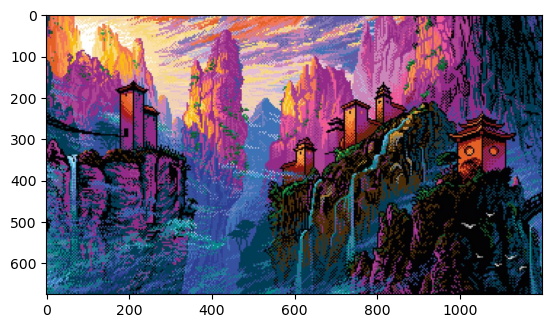

In [41]:
#Pixel Art
pixel_art = cv2.imread('pixel_art.jpg')
pixel_art2 = cv2.cvtColor(pixel_art, cv2.COLOR_BGR2RGB)
plt.figure()
plt.imshow(pixel_art2)
plt.grid(False)
plt.show()

In [42]:
pixel_scale = makeScale(3, 'a', 'HARMONIC_MINOR')
pixel_song, pixel_df,pixel_df_harmony = img2music(pixel_art, 
                                                  pixel_scale, 
                                                  T = 0.2, 
                                                  randomPixels = True)

wavfile.write('pixel_song2.wav'    , rate = 22050, data = pixel_song.astype(np.float32))
ipd.Audio(pixel_song, rate = sr)

In [43]:
pixel_df

,hues,frequencies
0,100,155.563492
1,100,155.563492
2,101,155.563492
3,101,155.563492
4,101,155.563492
...,...,...
209995,74,138.591315
209996,74,138.591315
209997,74,138.591315
209998,74,138.591315


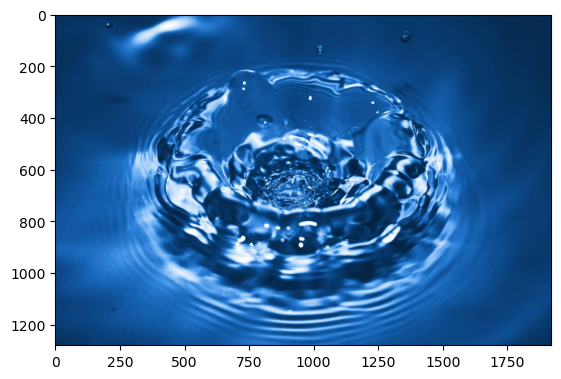

In [45]:
#Waterfall
waterfall = cv2.imread('water.jpg')
waterfall2 = cv2.cvtColor(waterfall, cv2.COLOR_BGR2RGB)
plt.figure()
plt.imshow(waterfall2)
plt.grid(False)
plt.show()

In [46]:
waterfall_scale = makeScale(1, 'd', 'MAJOR')
waterfall_song, waterfall_df,waterfall_song_harmony  = img2music(waterfall, 
                                                                waterfall_scale, 
                                                                T = 0.3,
                                                                randomPixels = True, 
                                                                useOctaves = True)

wavfile.write('waterfall_song2.wav'    , rate = 22050, data = waterfall_song.astype(np.float32))
ipd.Audio(waterfall_song, rate = sr)

In [47]:
waterfall_df

,hues,frequencies
0,100,51.913087
1,100,51.913087
2,101,51.913087
3,101,51.913087
4,101,51.913087
...,...,...
209995,74,48.999429
209996,74,48.999429
209997,74,48.999429
209998,74,48.999429


In [48]:
#Peacock
peacock = cv2.imread('peacock.jpg')
peacock2 = cv2.cvtColor(peacock, cv2.COLOR_BGR2RGB)
plt.figure()
plt.imshow(peacock2)
plt.grid(False)
plt.show()

[ WARN:0@563.303] global loadsave.cpp:241 findDecoder imread_('peacock.jpg'): can't open/read file: check file path/integrity


error: OpenCV(4.10.0) /Users/xperience/GHA-Actions-OpenCV/_work/opencv-python/opencv-python/opencv/modules/imgproc/src/color.cpp:196: error: (-215:Assertion failed) !_src.empty() in function 'cvtColor'


In [37]:
peacock_scale = makeScale(3, 'E', 'DORIAN')
peacock_song, peacock_df, peacock_song_harmony  = img2music(peacock, 
                                                            peacock_scale, 
                                                            T = 0.2, 
                                                            randomPixels = False,
                                                            useOctaves = True, nPixels = 120)

wavfile.write('peacock_song.wav'    , rate = 22050, data = peacock_song.astype(np.float32))
ipd.Audio(peacock_song, rate = sr)

In [23]:
peacock_df

,hues,frequencies
0,113,246.941651
1,89,220.000000
2,99,220.000000
3,94,220.000000
4,87,220.000000
...,...,...
230395,100,220.000000
230396,100,220.000000
230397,103,220.000000
230398,103,220.000000


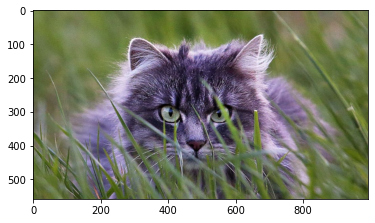

In [38]:
#Cat
cat = cv2.imread('cat1.jpg')
cat2 = cv2.cvtColor(cat, cv2.COLOR_BGR2RGB)
plt.figure()
plt.imshow(cat2)
plt.grid(False)
plt.show()

In [43]:
cat_scale = makeScale(2, 'f', 'AEOLIAN')
cat_song, cat_df,cat_song_harmony  = img2music(cat, 
                                               cat_scale, 
                                               T = 0.4, 
                                               randomPixels = True,
                                               useOctaves = True, 
                                               nPixels = 60)

wavfile.write('cat_song.wav'    , rate = 22050, data = cat_song.astype(np.float32))
ipd.Audio(cat_song, rate = sr)

In [26]:
cat_df

,hues,frequencies
0,113,69.295658
1,89,123.470825
2,99,123.470825
3,94,123.470825
4,87,123.470825
...,...,...
230395,100,123.470825
230396,100,123.470825
230397,103,123.470825
230398,103,123.470825


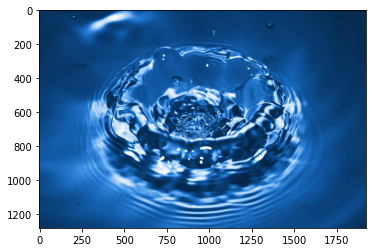

In [44]:
#water
water = cv2.imread('water.jpg')
water2 = cv2.cvtColor(water, cv2.COLOR_BGR2RGB)
plt.figure()
plt.imshow(water2)
plt.grid(False)
plt.show()

In [55]:
water_scale = makeScale(2, 'B', 'LYDIAN')
water_song, water_df, water_song_harmony  = img2music(water, 
                                                      water_scale, 
                                                      T = 0.2, 
                                                      randomPixels = False,
                                                      useOctaves = True, nPixels = 60)

wavfile.write('water_song2.wav'    , rate = 22050, data = water_song.astype(np.float32))
ipd.Audio(water_song, rate = sr)

In [29]:
water_df

,hues,frequencies
0,113,92.498606
1,89,87.307058
2,99,87.307058
3,94,87.307058
4,87,87.307058
...,...,...
230395,100,87.307058
230396,100,87.307058
230397,103,87.307058
230398,103,87.307058


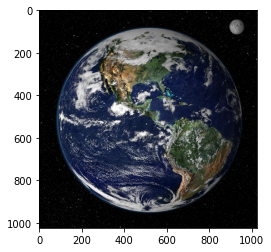

In [56]:
#earth
earth = cv2.imread('earth.jpg')
earth2 = cv2.cvtColor(earth, cv2.COLOR_BGR2RGB)
plt.figure()
plt.imshow(earth2)
plt.grid(False)
plt.show()

In [58]:
earth_scale = makeScale(3, 'g', 'MELODIC_MINOR')
earth_song, earth_df,earth_song_harmony  = img2music(earth, 
                                                     earth_scale, 
                                                     T = 0.3, 
                                                     randomPixels = False,
                                                     useOctaves = True, nPixels = 60)
wavfile.write('earth_song.wav'    , rate = 22050, data = earth_song.astype(np.float32))
ipd.Audio(earth_song, rate = sr)

In [71]:
earth_df

,hues,frequencies
0,113,155.563492
1,89,138.591315
2,99,138.591315
3,94,138.591315
4,87,138.591315
...,...,...
230395,100,138.591315
230396,100,138.591315
230397,103,138.591315
230398,103,138.591315


In [73]:
html = earth_df.to_html(max_rows = 10)
print(html)

<table border="1" class="dataframe">
  <thead>
    <tr style="text-align: right;">
      <th></th>
      <th>hues</th>
      <th>frequencies</th>
    </tr>
  </thead>
  <tbody>
    <tr>
      <th>0</th>
      <td>113</td>
      <td>155.563492</td>
    </tr>
    <tr>
      <th>1</th>
      <td>89</td>
      <td>138.591315</td>
    </tr>
    <tr>
      <th>2</th>
      <td>99</td>
      <td>138.591315</td>
    </tr>
    <tr>
      <th>3</th>
      <td>94</td>
      <td>138.591315</td>
    </tr>
    <tr>
      <th>4</th>
      <td>87</td>
      <td>138.591315</td>
    </tr>
    <tr>
      <th>...</th>
      <td>...</td>
      <td>...</td>
    </tr>
    <tr>
      <th>230395</th>
      <td>100</td>
      <td>138.591315</td>
    </tr>
    <tr>
      <th>230396</th>
      <td>100</td>
      <td>138.591315</td>
    </tr>
    <tr>
      <th>230397</th>
      <td>103</td>
      <td>138.591315</td>
    </tr>
    <tr>
      <th>230398</th>
      <td>103</td>
      <td>138.591315</td>
    </tr>
  

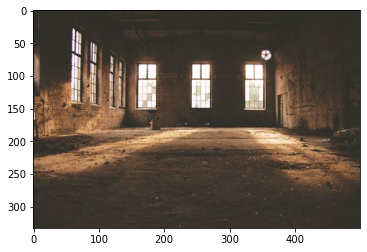

In [33]:
#old_building
old_building = cv2.imread('old_building.jpeg')
old_building2 = cv2.cvtColor(old_building, cv2.COLOR_BGR2RGB)
plt.figure()
plt.imshow(old_building2)
plt.grid(False)
plt.show()

In [34]:
old_building_scale = makeScale(2, 'd', 'PHYRIGIAN')
old_building_song, old_building_df  = img2music(old_building, old_building_scale,
                                     T = 0.3, randomPixels = True, useOctaves = True, nPixels = 60)
ipd.Audio(old_building_song, rate = sr)

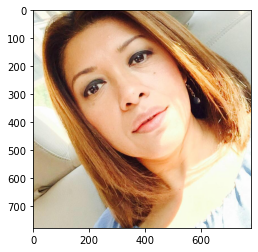

In [68]:
#mom
mom = cv2.imread('mami.jpg')
mom2 = cv2.cvtColor(mom, cv2.COLOR_BGR2RGB)
plt.figure()
plt.imshow(mom2)
plt.grid(False)
plt.show()

In [69]:
mom_scale = makeScale(3, 'g', 'MAJOR')
mom_song, mom_df  = img2music(mom, anto_scale,
                                     T = 0.3, randomPixels = True, useOctaves = True, nPixels = 60)
ipd.Audio(mom_song, rate = sr)

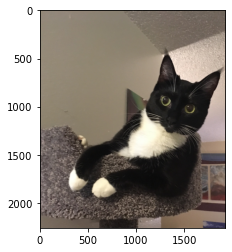

In [70]:
#old_building
catterina = cv2.imread('catterina.jpg')
catterina2 = cv2.cvtColor(catterina, cv2.COLOR_BGR2RGB)
plt.figure()
plt.imshow(catterina2)
plt.grid(False)
plt.show()

In [76]:
catterina_scale = makeScale(3, 'A', 'HARMONIC_MINOR')
catterina_song, catterina_df  = img2music(catterina, catterina_scale,
                                     T = 0.2, randomPixels = True, useOctaves = True, nPixels = 60)
ipd.Audio(catterina_song, rate = sr)

<p>Cool! The scale generator I made could easily accomodate new scales. Build your own scales :]</p>

<h2>Exporting song into a .wav file</h2>
<p>The following code can be used to export the song into a .wav file. Since the numpy arrays we are generating are dtype = float32 we need to specifiy that in the data paramter.</p>

In [84]:
from scipy.io import wavfile
wavfile.write('earth_song.wav'    , rate = 22050, data = earth_song.astype(np.float32))
wavfile.write('water_song.wav'    , rate = 22050, data = water_song.astype(np.float32))
wavfile.write('catterina_song.wav', rate = 22050, data = catterina_song.astype(np.float32))

I'll also do it now for an example in which I'm using harmony

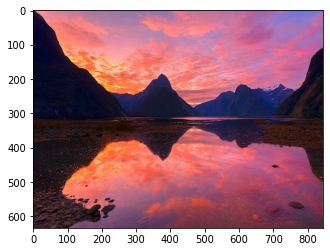

In [60]:
#nature
nature = cv2.imread('nature1.webp')
nature2 = cv2.cvtColor(nature, cv2.COLOR_BGR2RGB)
plt.figure()
plt.imshow(nature2)
plt.grid(False)
plt.show()

In [62]:
nature_scale = makeScale(3, 'a', 'HARMONIC_MINOR')
nature_song, nature_df, nature_harmony = img2music(nature, nature_scale, 
                                                 T = 0.2, randomPixels = True, harmonize = 'm3')

wavfile.write('nature_song1.wav', rate = 22050, data = nature_song.astype(np.float32))

#This is the original song we made from the picture
ipd.Audio(nature_song, rate = sr)

In [63]:
#This is the harmony to the song we made from the picture
wavfile.write('nature_song2.wav', rate = 22050, data = nature_harmony.astype(np.float32))
ipd.Audio(nature_harmony, rate = sr)

<p>The song and harmony arrays are both 1D. I can combine them into a 2D array using <code>np.vstack</code>. This will allow us to save our harmonized song into a single .wav file :]</p>

In [66]:
nature_harmony_combined = np.vstack((nature_song, nature_harmony))
wavfile.write('nature_harmony_combined.wav',
              rate = 22050,
              data = nature_harmony_combined.T.astype(np.float32))
ipd.Audio(nature_harmony_combined, rate = sr)

In [176]:
print(nature_harmony_combined.shape)

(2, 264600)


<p>From the documentation for scipy.io.wavfile.write, if want to write a 2D array into a .wav file, the 2D array must be have dimensions in the form of (Nsamples, Nchannels). Notice how the shape of our array is currently (2, 264600). This means we have Nchannels = 2 and Nsamples = 264600. To ensure our numpy array has the correct shape for scipy.io.wavfile.write I'll transpose the array first.</p>

In [173]:
wavfile.write('nature_harmony_combined.wav', rate = 22050, 
              data = nature_harmony_combined.T.astype(np.float32))

<h2>Adding Effects to Our Music with Pedalboard</h2>

Now I'm going to load the .wav files and do some extra  manipulation on it using the pedalboard module from Spotify. You can read more about the pedalboard library <a href = "https://github.com/spotify/pedalboard">here</a> and <a href = "https://spotify.github.io/pedalboard/reference/pedalboard.html">here</a>.

In [67]:
from pedalboard import Pedalboard, Chorus, Reverb, Compressor, Gain, LadderFilter 
from pedalboard import Phaser, Delay, PitchShift, Distortion
from pedalboard.io import AudioFile
# Read in a whole audio file:
with AudioFile('water_song.wav', 'r') as f:
    audio = f.read(f.frames)
    samplerate = f.samplerate

# Make a Pedalboard object, containing multiple plugins:
board = Pedalboard([
    #Delay(delay_seconds=0.25, mix=1.0),
    Compressor(threshold_db=-100, ratio=25),
    Gain(gain_db=150),
    Chorus(),
    LadderFilter(mode=LadderFilter.Mode.HPF12, cutoff_hz=900),
    Phaser(),
    Reverb(room_size=0.5),
])

# Run the audio through this pedalboard!
effected = board(audio, samplerate)

# Write the audio back as a wav file:
with AudioFile('processed-water_song.wav', 'w', samplerate, effected.shape[0]) as f:
    f.write(effected)

ipd.Audio('processed-water_song.wav')

In [121]:
# Read in a whole audio file:
with AudioFile('catterina_song.wav', 'r') as f:
    audio = f.read(f.frames)
    samplerate = f.samplerate
print(samplerate)
# Make a Pedalboard object, containing multiple plugins:
board = Pedalboard([
    LadderFilter(mode=LadderFilter.Mode.HPF12, cutoff_hz=100),
    Delay(delay_seconds = 0.3),
    Reverb(room_size = 0.6, wet_level=0.2, width = 1.0),
    PitchShift(semitones = 6),
])

# Run the audio through this pedalboard!
effected = board(audio, samplerate)

# Write the audio back as a wav file:
with AudioFile('processed-catterina_song.wav', 'w', samplerate, effected.shape[0]) as f:
    f.write(effected)

ipd.Audio('processed-catterina_song.wav')

22050.0


In [226]:
# Read in a whole audio file:
with AudioFile('nature_harmony_combined.wav', 'r') as f:
    audio = f.read(f.frames)
    samplerate = f.samplerate
# Make a Pedalboard object, containing multiple plugins:
board = Pedalboard([
    LadderFilter(mode=LadderFilter.Mode.HPF12, cutoff_hz=100),
    Delay(delay_seconds = 0.1),
    Reverb(room_size = 1, wet_level=0.1, width = 0.5),
    PitchShift(semitones = 6),
    #Chorus(rate_hz = 15),
    Phaser(rate_hz = 5, depth = 0.5, centre_frequency_hz = 500.0),
])

# Run the audio through this pedalboard!
effected = board(audio, samplerate)

# Write the audio back as a wav file:
with AudioFile('processed-nature_harmony_combined.wav', 'w', samplerate, effected.shape[0]) as f:
    f.write(effected)

ipd.Audio('processed-nature_harmony_combined.wav')

Neat!

<h2>Using Librosa For Mapping Other Musical Quantities</h2>

<p>Librosa is a wonderful package that allows one to carry out a variety of operations on sound data. Here I used it to readily convert frequencies into 'Notes' and 'Midi Numbers'.</p>

In [177]:
#Convert frequency to a note
catterina_df['notes'] = catterina_df.apply(lambda row : librosa.hz_to_note(row['frequencies']), 
                                           axis = 1)  
#Convert note to a midi number
catterina_df['midi_number'] = catterina_df.apply(lambda row : librosa.note_to_midi(row['notes']), 
                                                 axis = 1)    
catterina_df

,hues,frequencies,notes,midi_number
0,113,164.813778,E3,52
1,89,146.832384,D3,50
2,99,146.832384,D3,50
3,94,146.832384,D3,50
4,87,146.832384,D3,50
...,...,...,...,...
230395,100,146.832384,D3,50
230396,100,146.832384,D3,50
230397,103,146.832384,D3,50
230398,103,146.832384,D3,50


In [70]:
html = catterina_df.to_html()
print(html)

NameError: name 'catterina_df' is not defined

<h2>Making a MIDI from our Song</h2>

<p>Now that I've generated a dataframe containing frequencies, notes and midi numbers I can make a midi file out of it! I could then use this MIDI file to generate sheet music for our song :]</p>

<p>To make a MIDI file, I'll make use of the <code>midiutil</code> package. This package allows us to build MIDI files from an array of MIDI numbers. You can configure your file in a variety of ways by setting up volume, tempos and tracks. For now, I'll just make a single track midi file</p>

In [178]:
#Convert midi number column to a numpy array
midi_number = catterina_df['midi_number'].to_numpy()

In [124]:
degrees  = list(midi_number) # MIDI note number
track    = 0
channel  = 0
time     = 0   # In beats
duration = 1   # In beats
tempo    = 240  # In BPM
volume   = 100 # 0-127, as per the MIDI standard

MyMIDI = MIDIFile(1) # One track, defaults to format 1 (tempo track
                     # automatically created)
MyMIDI.addTempo(track,time, tempo)

for pitch in degrees:
    MyMIDI.addNote(track, channel, pitch, time, duration, volume)
    time = time + 1
with open("catterina.mid", "wb") as output_file:
    MyMIDI.writeFile(output_file)

<h2>Converting hues to frequencies (2nd Idea)</h2>

<p>My second idea to convert color into sound was via a 'spectral' method. This is something that I'm still playing around with.</p>

In [49]:
#Convert hue to wavelength[nm] via interpolation. Assume spectrum is contained between 400-650nm
def hue2wl(h, wlMax = 650, wlMin = 400, hMax = 270, hMin = 0):
    #h *= 2
    hMax /= 2
    hMin /= 2
    wlRange = wlMax - wlMin
    hRange = hMax - hMin
    wl =  wlMax - ((h* (wlRange))/(hRange))
    return wl

OSError: 'seaborn-darkgrid' is not a valid package style, path of style file, URL of style file, or library style name (library styles are listed in `style.available`)

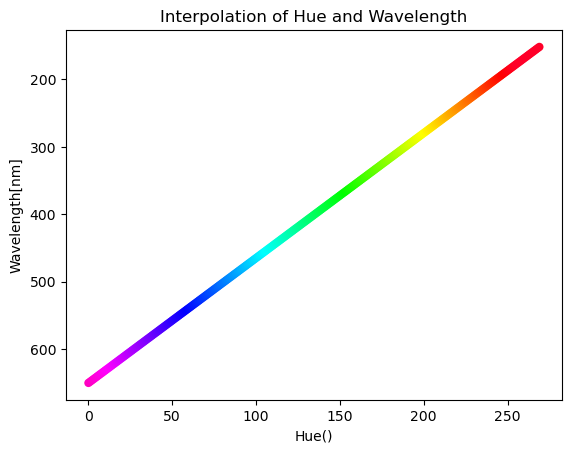

In [51]:
#Array with hue values from 0 degrees to 270 degrees
h_array = np.arange(0,270,1)
h_array.shape

# define vectorized sigmoid
hue2wl_v = np.vectorize(hue2wl)
test = hue2wl_v(h_array)
test.shape
np.min(test)

plt.title("Interpolation of Hue and Wavelength") 
plt.xlabel("Hue()") 
plt.ylabel("Wavelength[nm]") 
plt.scatter(h_array, test, c = cm.gist_rainbow_r(np.abs(h_array)), edgecolor='none')
plt.gca().invert_yaxis()
plt.style.use('seaborn-darkgrid')
plt.show()

In [52]:
img = cv2.imread('colors.jpg')
#Convert a hue value to wavelength via interpolation
#Assume that visible spectrum is contained between 400-650nm
def hue2wl(h, wlMax = 650, wlMin = 400, hMax = 270, hMin = 0):
    #h *= 2
    hMax /= 2
    hMin /= 2
    wlRange = wlMax - wlMin
    hRange = hMax - hMin
    wl =  wlMax - ((h* (wlRange))/(hRange))
    return wl

def wl2freq(wl):
    wavelength = wl
    sol = 299792458.00 #this is the speed of light in m/s
    sol *= 1e9 #Convert speed of light to nm/s
    freq = (sol / wavelength) * (1e-12)
    return freq

def img2music2(img, fName):
    
    #Get height and width of image
    height, width, _ = img.shape
    
    #Convet from BGR to HSV
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    
    #Populate hues array with H channel for each pixel
    i=0 ; j=0
    hues = []
    for i in range(height):
        for j in range(width):
            hue = hsv[i][j][0] #This is the hue value at pixel coordinate (i,j)
            hues.append(hue)
            
    #Make pandas dataframe        
    hues_df = pd.DataFrame(hues, columns=['hues'])
    hues_df['nm'] = hues_df.apply(lambda row : hue2wl(row['hues']), axis = 1)  
    hues_df['freq'] = hues_df.apply(lambda row : wl2freq(row['nm']), axis = 1) 
    hues_df['notes'] = hues_df.apply(lambda row : librosa.hz_to_note(row['freq']), axis = 1)  
    hues_df['midi_number'] = hues_df.apply(lambda row : librosa.note_to_midi(row['notes']), axis = 1) 
    
    print("Done making song from image!") 
    
    return hues_df

In [53]:
df = img2music2(img,'color')
df

NameError: name 'librosa' is not defined

In [68]:
html = df.to_html()
print(html)

NameError: name 'df' is not defined

In [183]:
#Convert midi number column to a numpy array
sr = 22050 # sample rate
song = df['freq'].to_numpy()
ipd.Audio(song, rate = sr) # load a NumPy array

In [184]:
a_HarmonicMinor = [220.00, 246.94 ,261.63, 293.66, 329.63, 349.23, 415.30, 440.00] 
frequencies = df['freq'].to_numpy()
song = np.array([]) 
harmony = np.array([]) 
octaves = np.array([1/4,1,2,1,2])
sr = 22050 # sample rate
T = 0.25    # 0.1 second duration
t = np.linspace(0, T, int(T*sr), endpoint=False) # time variable
#Make a song with numpy array :]
nPixels = int(len(frequencies)/height)
nPixels = 30
#for j in tqdm(range(nPixels), desc="Processing Frame"):#Add progress bar for frames processed      
for i in range(nPixels):  
    octave = random.choice(octaves)
    val =  octave * frequencies[i]
    note  = 0.5*np.sin(2*np.pi*val*t)
    song  = np.concatenate([song, note])
ipd.Audio(song, rate=sr) # load a NumPy array

<h2>Conclusion</h2>
I showed how musis can be made from images and how our songs can be exported into .wav files for subsequent processing. There's tons of expereimentation that can be done with this. I had fun making this project and I hope you have using it and building upon it!